1. Easy

Импортируем библиотеки, загрузим данные:

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram , linkage
from sklearn.cluster import DBSCAN

В таблице есть Nan-ы, а также ID, который в конкретном случае ни на что не влияет. Подкорректируем табличку:

In [2]:
df_with_nans = pd.read_csv('archive (3)/CC GENERAL.csv')
df = df_with_nans.dropna()
df = df.drop('CUST_ID', axis=1)
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Гипотеза: хорошим разделением будет разделение на 2 группы(условно "хорошо обеспеченных" и "малообеспеченных"). Проверим:

In [3]:
model = KMeans(n_clusters = 2)
labels = model.fit_predict(df)

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


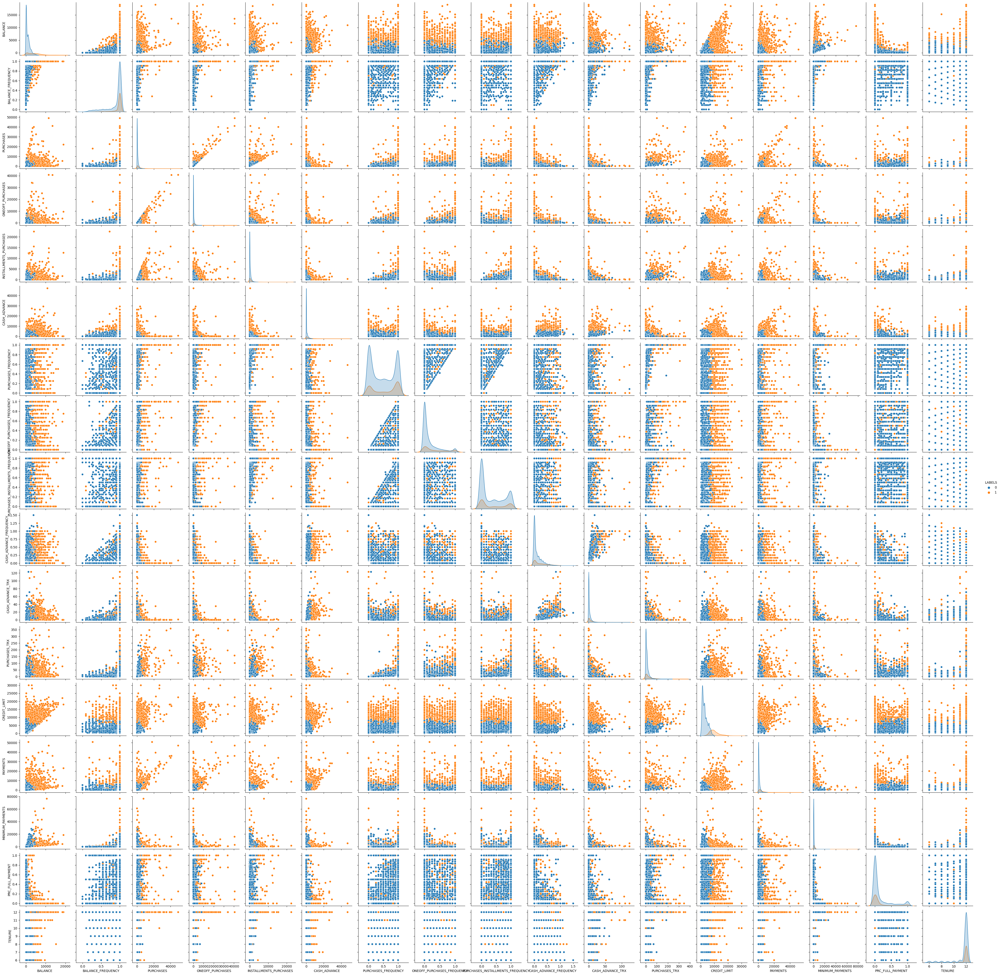

In [4]:
df['LABELS'] = labels
sns.pairplot(df, hue = 'LABELS')

Как видно(по диагонали), наибольшие различия разделения - по характеристикам типа 'BALANCE', 'PURCHASES', 'PURCHASES_FREQUENSY' и т.д., по большей части отвечающих за материальное состояние клиента, а значит, предположение о разбиении на 2 кластера("хорошо обеспеченных" и "малообеспеченных") можно считать более-менее обоснованным(но далее поймем, что оптимальнее - брать 4).

2.Normal

Попробуем вычислить оптимальное количество кластеров для K-means:

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/skle

Text(0.5, 1.0, 'Elbow method')

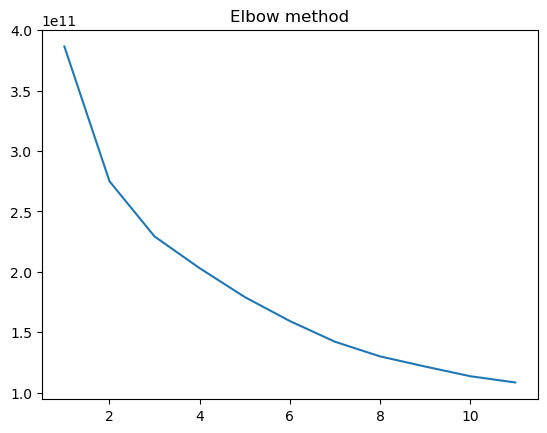

In [5]:
def distance_n(d, n):
    model = KMeans(n_clusters=n)
    model.fit(d)
    return model.inertia_
distances = [distance_n(df, n) for n in range(1, 12)]
plt.plot(range(1, 12), distances)
plt.title('Elbow method')

Как видно по методу локтя, "оптимальное количество" кластеров - от 2 до 4, но, поскольку после 4 идет сильное снижение, то самым оптимальным вариантом будет n = 4.

Обучим другими способами, например, иерархической кластеризацией. Для начала, изучим дендограмму:

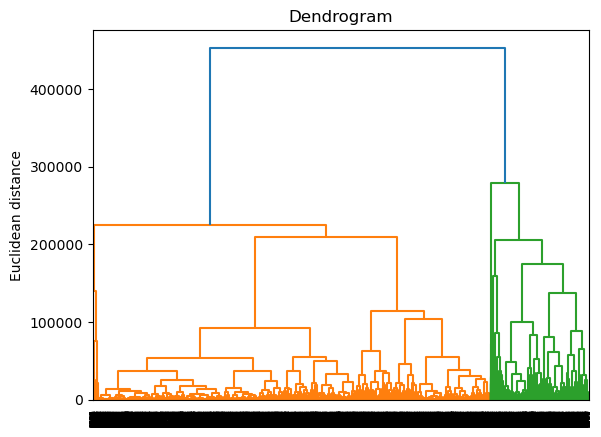

In [6]:
Z = linkage(df, method = 'ward')
dendro = dendrogram(Z)
plt.title('Dendrogram')
plt.ylabel('Euclidean distance')
plt.show()  

Посмотрим на дендограмму. Понятно, что не стоит соединять кластеры по синей линии, поскольку евклидово расстояние между кластерами на этом этапе велико(в два раза больше, чем максимальное расстояние внутри одного цвета). Также, оптимальнее будет не объединять все по оранжевой линии и по зеленой, а разбить на несколько частей(к примеру, у оранжевых взять 2-3 кластера, а не объединять все в один кластер, у зеленых - 1-2 кластера, а не объединять все в один кластер). Итого, получим, что 4 в данном случае - снова оптимальное количество кластеров. Обучим модель на 4 кластерах, сравним с KMeans:

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


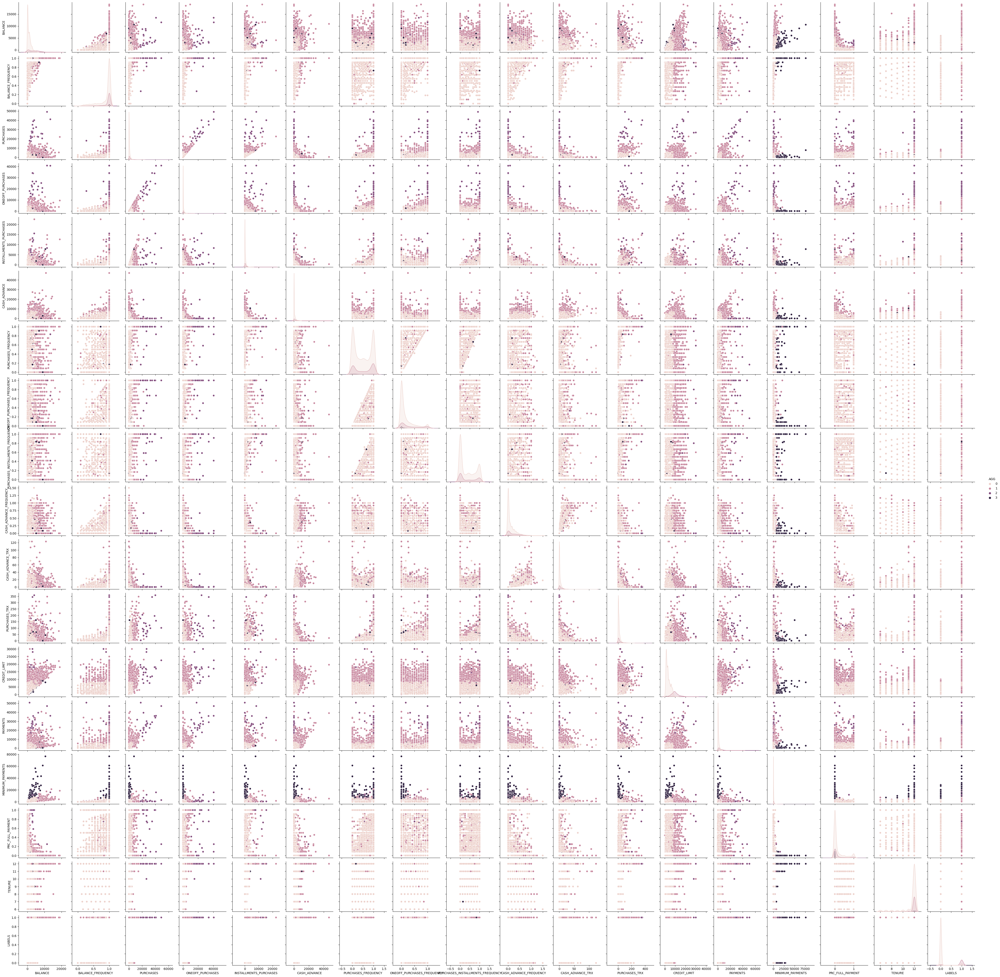

In [7]:
agg = AgglomerativeClustering(4).fit_predict(df)
df['AGG'] = agg
sns.pairplot(df, hue = 'AGG')

По признакам, наиболее связанным с состоянием клиента(типа признаков выше для KMeans) картинка получилась похожей. Графики между признаками правее и ниже отличаются заметнее.

Теперь обучим с помощью DBSCAN:

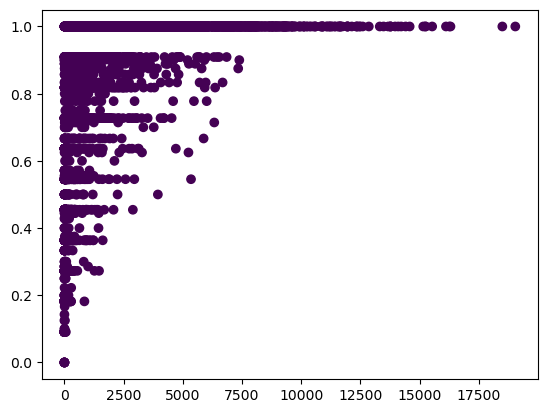

In [9]:
res = DBSCAN(eps=0.0001, min_samples=200).fit_predict(df)
df['RES'] = res
X = df.iloc[:, :-1]
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=res)

Я пробовал брать разные эпсилоны и минимальные сэмплы, но даже при маленьких эпсилонах и больших min_samples получился 1 кластер(.